### Precision Segmentation of Retinal Nerve Fibers in Fundus Images using Deep Learning


Extracting the zip files containg datasets

In [ ]:
import zipfile

# Extract the first dataset
with zipfile.ZipFile('/content/rpi (2).zip', 'r') as zip_ref:
    zip_ref.extractall('/content/sample_data')

# Extract the second dataset
with zipfile.ZipFile('/content/all (1).zip', 'r') as zip_ref:
    zip_ref.extractall('/content/sample_data')


### Image and Mask Preprocessing from Multiple Datasets
This code snippet is tailored to efficiently load and preprocess image data along with corresponding masks from multiple specified directories. It utilizes TensorFlow's image handling capabilities to resize, normalize, and prepare images for uniform input into machine learning models, while also binarizing masks for tasks such as segmentation. The script ensures that images and masks are aligned by name and then splits the data into training and validation sets, which helps in optimizing model training and evaluation processes. This approach allows for the integration of varied datasets, enhancing the robustness and generalizability of the trained models.

In [ ]:
import os
import glob
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
from sklearn.model_selection import train_test_split

# Assuming previous definitions and imports are available

def gather_paths_simple(base_dir, categories):
    path_dict = {}
    for category in categories:
        file_extension = "*.tif" if "manual1" in category else "*.jpg"
        path_dict[category] = sorted(glob.glob(f"{base_dir}/{category}/" + file_extension))
    return path_dict

# Load image function with a check for mask presence
def load_image(filename, is_mask=False, target_size=(256, 256)):
    img = load_img(filename, target_size=target_size, color_mode='grayscale' if is_mask else 'rgb')
    img = img_to_array(img)
    if is_mask:
        img = (img > 127).astype(np.float32)
    else:
        img = img.astype(np.float32) / 255.0
    return img.squeeze(-1) if is_mask else img

# Paths for images and masks
second_dataset_path = "/content/sample_data"
categories_second = ["images", "manual1"]
paths = gather_paths_simple(second_dataset_path, categories_second)

# Extracting base names to pair images and masks
image_names = set(os.path.splitext(os.path.basename(x))[0] for x in paths['images'])
mask_names = set(os.path.splitext(os.path.basename(x))[0] for x in paths['manual1'])

common_names = image_names & mask_names
paired_images = [x for x in paths['images'] if os.path.splitext(os.path.basename(x))[0] in common_names]
paired_masks = [x for x in paths['manual1'] if os.path.splitext(os.path.basename(x))[0] in common_names]

# Load images and masks that are paired
all_images = [load_image(f) for f in paired_images]
all_masks = [load_image(f, is_mask=True) for f in paired_masks]

# Convert to numpy arrays
all_images = np.array(all_images)
all_masks = np.array(all_masks)

# Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(all_images, all_masks, test_size=0.2, random_state=42)

# Print dataset sizes to confirm correct loading
print("Training set shapes: Images {}, Masks {}".format(X_train.shape, y_train.shape))
print("Validation set shapes: Images {}, Masks {}".format(X_val.shape, y_val.shape))


# Normalize the masks
y_train_normalized = y_train / 255.0
y_val_normalized = y_val / 255.0


Training set shapes: Images (24, 256, 256, 3), Masks (24, 256, 256)
Validation set shapes: Images (6, 256, 256, 3), Masks (6, 256, 256)


### Visualizing Image and Mask Pairs
This script is designed to display pairs of images alongside their corresponding masks, providing a visual verification of the data preprocessing and alignment. It randomly selects three examples from the datasets and presents each image with its respective mask in a side-by-side format.

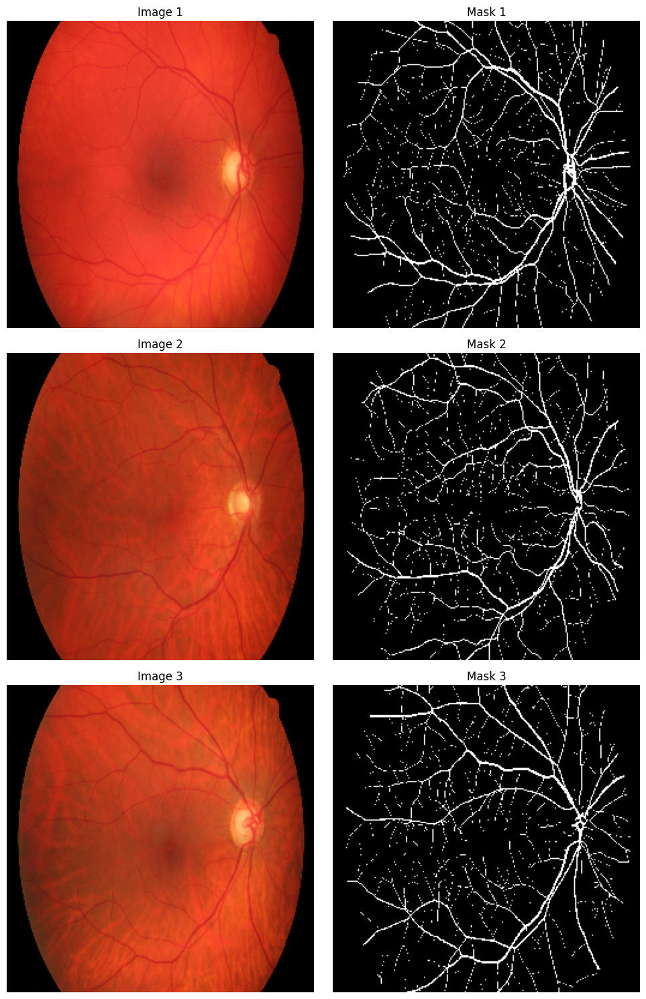

In [ ]:
import matplotlib.pyplot as plt

def display_images_with_masks(images, masks, num_images=3):
    """Display pairs of images and their corresponding masks."""
    plt.figure(figsize=(10, 5 * num_images))

    for i in range(num_images):
        # Display the image
        plt.subplot(num_images, 2, 2*i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.title(f'Image {i+1}')
        plt.axis('off')

        # Display the corresponding mask
        plt.subplot(num_images, 2, 2*i + 2)
        plt.imshow(masks[i], cmap='gray')
        plt.title(f'Mask {i+1}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Select the first three images and masks from the training dataset
sample_images = X_train[:3]
sample_masks = y_train_normalized[:3]

# Call the function to display the images
display_images_with_masks(sample_images, sample_masks)


### Hybrid Deep Learning Model Implementation with Attention Mechanism
This script demonstrates the implementation of a hybrid deep learning model that combines the robust features of EfficientNetB0 with a U-Net architecture, integrated through the segmentation-models library. The model is enhanced with an attention mechanism, which helps in focusing on relevant features by selectively weighting the importance of different regions in the input data. This approach utilizes convolutional operations, transpose convolutions for upscaling, and batch normalization to stabilize and accelerate the learning process.
Key components include the attention_gate function, which dynamically adjusts the flow of information through the network by gating features, and decoder_block functions that progressively reconstruct the output resolution while integrating context from deeper layers. This model setup is specifically tuned for segmentation tasks, leveraging pre-trained ImageNet weights to improve initial feature extraction capabilities.

In [ ]:
!pip install -U -q segmentation-models
!pip install -q keras==2.15.0

import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

import segmentation_models as sm
from keras.layers import Input, Conv2D, Conv2DTranspose, Activation, BatchNormalization, add, multiply, UpSampling2D, concatenate
from keras.models import Model

# Set the framework for segmentation_models
sm.set_framework('tf.keras')


def attention_gate(inputs, gate_signal, inter_channels):
    theta_x = Conv2D(inter_channels, (1, 1), strides=(2, 2), padding='same')(inputs)
    phi_g = Conv2D(inter_channels, (1, 1), padding='same')(gate_signal)
    upsample_theta_x = UpSampling2D(size=(2, 2))(theta_x)
    concat_xg = add([upsample_theta_x, phi_g])
    act_xg = Activation('relu')(concat_xg)
    psi = Conv2D(1, (1, 1), padding='same', activation='sigmoid')(act_xg)
    return multiply([inputs, psi])

def decoder_block(input_tensor, concat_tensor, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=(2, 2), padding='same')(input_tensor)
    attention = attention_gate(concat_tensor, x, num_filters // 2)
    x = concatenate([x, attention], axis=-1)
    x = Conv2D(num_filters, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(num_filters, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

def create_efficient_unet(input_shape):
    backbone = sm.Unet('efficientnetb0', encoder_weights='imagenet', encoder_freeze=True, input_shape=input_shape, classes=1, activation='sigmoid')
    # Using the backbone's layers directly as inputs and outputs for clarity
    input_tensor = backbone.input
    outputs = backbone.output

    model = Model(inputs=[input_tensor], outputs=[outputs])
    return model

input_shape = (256, 256, 3)
model = create_efficient_unet(input_shape)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.5 MB/s eta 0:00:00
Segmentation Models: using `tf.keras` framework.
16804768/16804768 [==============================] - 0s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 stem_conv (Conv2D)          (None, 128, 128, 32)         864       ['input_1[0][0]']             
                                                                                                  
 stem_bn (BatchNormalizatio  (None, 128, 128, 32)         128       ['stem_conv[0][0]']           
 n)                                                                                             

### Efficient Deep Learning Training with Custom Callbacks
This script sets up a deep learning model using TensorFlow and custom callbacks to enhance training efficiency. It employs a U-Net architecture with an EfficientNetB0 backbone, optimized for image segmentation tasks. The model uses callbacks for saving checkpoints and reducing the learning rate on plateaus

In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import Callback, ReduceLROnPlateau
import numpy as np
import os

class CustomModelCheckpoint(Callback):
    def __init__(self, filepath, save_freq):
        super(CustomModelCheckpoint, self).__init__()
        self.filepath = filepath
        self.save_freq = save_freq

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.save_freq == 0:
            filepath = self.filepath.format(epoch=epoch + 1, **logs)
            self.model.save(filepath, overwrite=True)
            print(f'\nSaved model to {filepath} at epoch {epoch + 1}')


input_shape = (256, 256, 3)
model = create_efficient_unet(input_shape=input_shape)

# Compile the model with binary_crossentropy loss
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Define the callbacks
checkpointer = CustomModelCheckpoint(filepath='/mnt/data/model_for_segmentation_epoch_{epoch:04d}.h5', save_freq=100)
reduce_lr = ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.0001, verbose=1)

# Fit the model
history = model.fit(
    X_train, y_train_normalized,
    batch_size=16,
    epochs=500,
    validation_data=(X_val, y_val_normalized),
    callbacks=[checkpointer, reduce_lr]
)


Epoch 1/500
2/2 [==============================] - 22s 2s/step - loss: 1.3258 - accuracy: 0.1204 - val_loss: 10.5099 - val_accuracy: 0.0000e+00 - lr: 0.0010
Epoch 2/500
2/2 [==============================] - 0s 121ms/step - loss: 1.0127 - accuracy: 0.1804 - val_loss: 14.3200 - val_accuracy: 0.0132 - lr: 0.0010
Epoch 3/500
2/2 [==============================] - 0s 122ms/step - loss: 0.8075 - accuracy: 0.3336 - val_loss: 13.9224 - val_accuracy: 0.0129 - lr: 0.0010
Epoch 4/500
2/2 [==============================] - 0s 122ms/step - loss: 0.6844 - accuracy: 0.5404 - val_loss: 13.9215 - val_accuracy: 0.0000e+00 - lr: 0.0010
Epoch 5/500
2/2 [==============================] - 0s 121ms/step - loss: 0.5895 - accuracy: 0.7425 - val_loss: 14.7508 - val_accuracy: 0.0000e+00 - lr: 0.0010
Epoch 6/500
2/2 [==============================] - ETA: 0s - loss: 0.5240 - accuracy: 0.8520
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
2/2 [==============================] - 0s 124

### Training and Validation Loss Trends

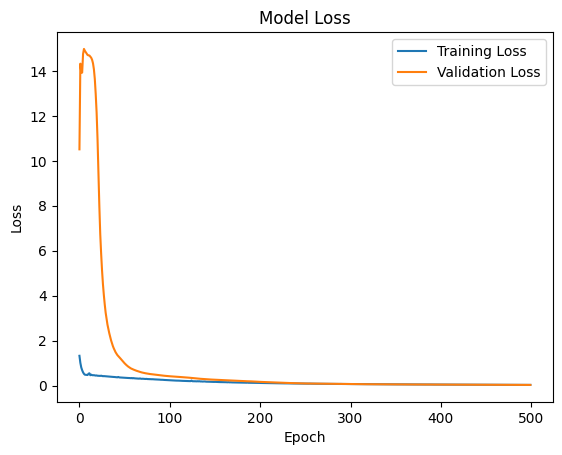

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


1/1 [==============================] - 1s 1s/step


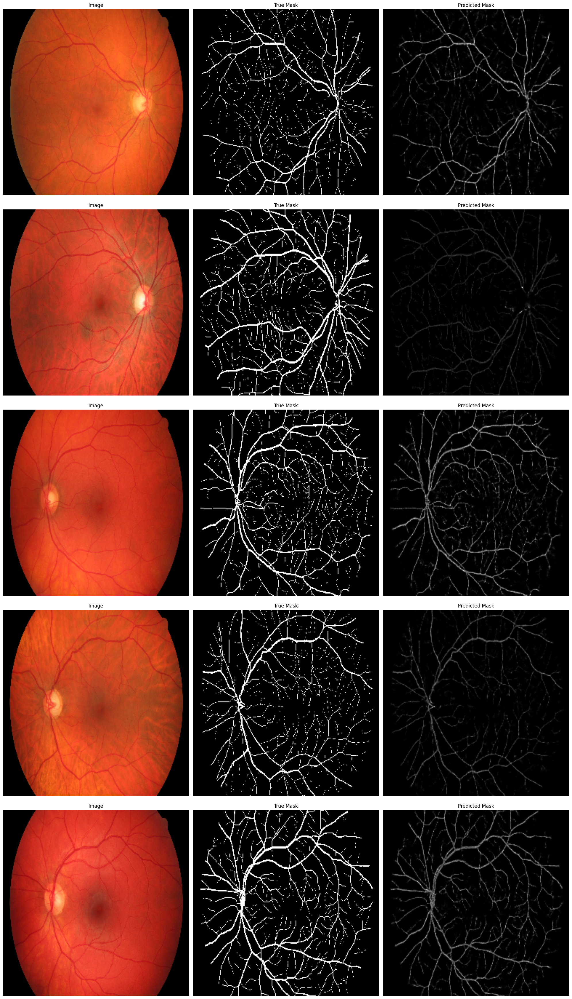

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random
from tensorflow.keras.models import load_model

# Function to adjust the brightness of the predicted masks
def adjust_brightness(image, factor=2.0):
    return np.clip(image * factor, 0, 1)

# Function to display images along with their true and predicted masks
def display_images_and_masks(images, true_masks, preds_masks, number_to_display=10):
    plt.figure(figsize=(20, number_to_display * 7))

    for i in range(number_to_display):
        index = random.randint(0, len(images) - 1)
        image = images[index]
        true_mask = true_masks[index]
        predicted_mask = preds_masks[index]

        plt.subplot(number_to_display, 3, 3*i + 1)
        plt.imshow(image.squeeze())
        plt.title('Image')
        plt.axis('off')

        plt.subplot(number_to_display, 3, 3*i + 2)
        plt.imshow(true_mask.squeeze(), cmap='gray')
        plt.title('True Mask')
        plt.axis('off')

        plt.subplot(number_to_display, 3, 3*i + 3)
        plt.imshow(predicted_mask.squeeze(), cmap='gray')
        plt.title('Predicted Mask')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Path to the saved model
model_path = '/content/model_for_segmentation_epoch_500.h5'

# Load the model from the specified path
model = load_model(model_path)

# Use the loaded model to predict masks for the training images
preds_masks = model.predict(X_train, verbose=1)

# Adjust the brightness of the predicted masks to improve visibility
adjusted_preds_masks = np.array([adjust_brightness(mask, factor=1.0) for mask in preds_masks])

# Display a set of images with their true and predicted masks
display_images_and_masks(X_train, y_train, adjusted_preds_masks, number_to_display=5)


### Predicting the Mask for a New Image Using a Pre-Trained Model


<ipython-input-11-f441329ed7e0>:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize(target_size, Image.ANTIALIAS)


1/1 [==============================] - 0s 48ms/step


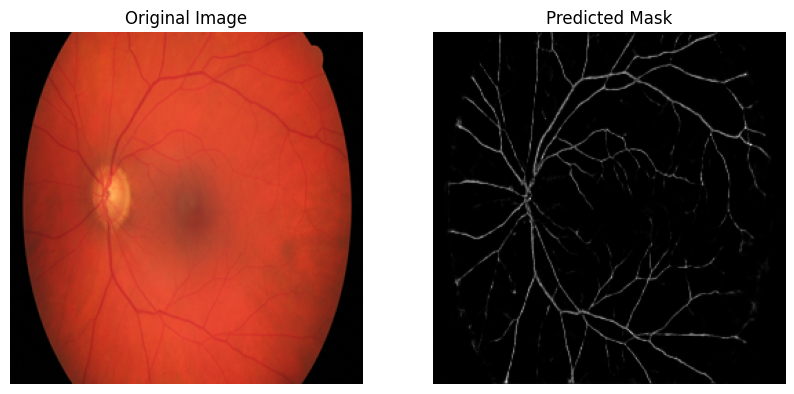

In [ ]:
from PIL import Image
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib.pyplot as plt
import numpy as np

# Function to load and preprocess the new retinal image
def load_and_preprocess_image(image_path, target_size=(256, 256)):
    img = Image.open(image_path)
    img = img.resize(target_size, Image.ANTIALIAS)
    img_array = img_to_array(img) / 255.0
    return img_array

# Load and preprocess the new retinal image
new_image_path = "/content/Image1.jpg"
new_image = load_and_preprocess_image(new_image_path)

# Use the trained model to predict the mask for the new image
predicted_mask = model.predict(np.expand_dims(new_image, axis=0))[0]

def adjust_brightness(image, factor=2.0):
    return np.clip(image * factor, 0, 1)

adjusted_predicted_mask = adjust_brightness(predicted_mask, factor=40.0)

plt.figure(figsize=(10, 5))

# Display the original image
plt.subplot(1, 2, 1)
plt.imshow(new_image)
plt.title("Original Image")
plt.axis("off")

# Display the predicted mask
plt.subplot(1, 2, 2)
plt.imshow(adjusted_predicted_mask.squeeze(), cmap="gray")
plt.title("Predicted Mask")
plt.axis("off")

plt.show()


### EfficientNetB0-Based U-Net Model Setup
This configuration establishes a U-Net model leveraging the EfficientNetB0 architecture as its backbone, specifically designed for binary classification tasks. The model harnesses pretrained ImageNet weights to maximize initial feature extraction effectiveness. Setup within the TensorFlow Keras environment under the segmentation models framework ensures smooth integration and optimal performance. The model is prepared with Adam optimizer and binary cross-entropy loss, which is ideal for dichotomous outcome predictions. This setup is primed for training with appropriately formatted and dimensioned datasets.

In [ ]:
import os
import tensorflow as tf
import segmentation_models as sm
import numpy as np
import matplotlib.pyplot as plt

# Set the TensorFlow Keras backend for segmentation_models
os.environ["SM_FRAMEWORK"] = "tf.keras"
sm.set_framework('tf.keras')

# Configuration of parameters for the model
MODEL_ARCHITECTURE = 'efficientnetb0'
TOTAL_CLASSES = 1
FINAL_ACTIVATION = 'sigmoid'

# Initialize and compile the U-Net model with EfficientNetB0 as the backbone
segmentation_model = sm.Unet(MODEL_ARCHITECTURE, classes=TOTAL_CLASSES, activation=FINAL_ACTIVATION, encoder_weights='imagenet')
segmentation_model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])


# Save the model
model_path = '/mnt/data/segmentation_model.h5'
segmentation_model.save(model_path)
print(f"Model saved at {model_path}")


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model saved at /mnt/data/segmentation_model.h5


### Training the EfficientNetB0 Model

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Setup the ModelCheckpoint callback
checkpoint_path = '/mnt/data/segmentation_model_epoch_{epoch:02d}.h5'
checkpoint_callback = ModelCheckpoint(
    checkpoint_path,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    mode='min'
)

# Fit the model with the callback
history = segmentation_model.fit(
    x=X_train,
    y=y_train_normalized,
    batch_size=5,
    epochs=500,
    validation_split=0.2,
    verbose=2,
    callbacks=[checkpoint_callback]
)


Epoch 1/500

Epoch 1: val_loss improved from inf to 8.21206, saving model to /mnt/data/segmentation_model_epoch_01.h5
4/4 - 38s - loss: 1.1347 - accuracy: 0.0897 - val_loss: 8.2121 - val_accuracy: 0.0038 - 38s/epoch - 9s/step
Epoch 2/500

Epoch 2: val_loss did not improve from 8.21206
4/4 - 0s - loss: 0.8267 - accuracy: 0.2143 - val_loss: 13.5111 - val_accuracy: 0.0037 - 264ms/epoch - 66ms/step
Epoch 3/500

Epoch 3: val_loss did not improve from 8.21206
4/4 - 0s - loss: 0.6581 - accuracy: 0.5146 - val_loss: 14.1264 - val_accuracy: 0.0305 - 276ms/epoch - 69ms/step
Epoch 4/500

Epoch 4: val_loss did not improve from 8.21206
4/4 - 0s - loss: 0.5480 - accuracy: 0.8289 - val_loss: 12.8004 - val_accuracy: 0.0846 - 263ms/epoch - 66ms/step
Epoch 5/500

Epoch 5: val_loss did not improve from 8.21206
4/4 - 0s - loss: 0.4708 - accuracy: 0.9020 - val_loss: 10.1133 - val_accuracy: 0.1515 - 265ms/epoch - 66ms/step
Epoch 6/500

Epoch 6: val_loss improved from 8.21206 to 2.29508, saving model to /mnt/

### Visualizing Model Training Progress


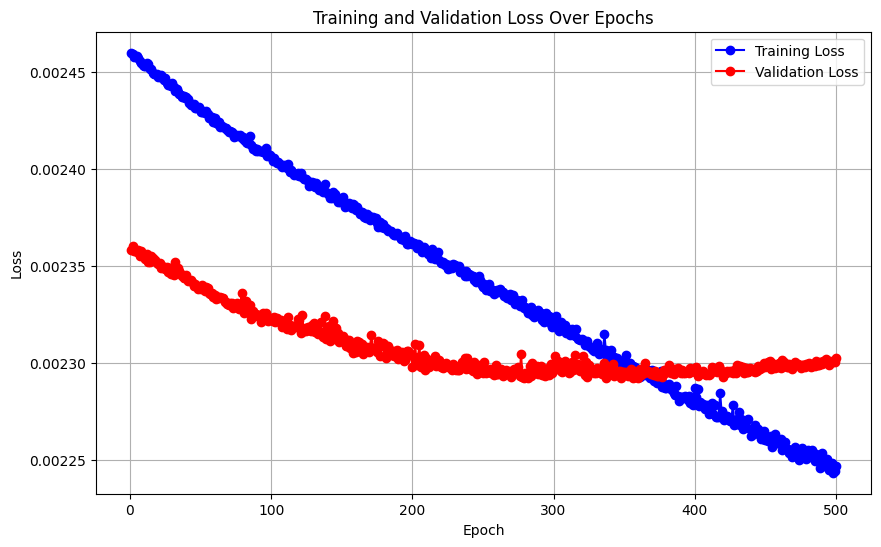

In [ ]:
import matplotlib.pyplot as plt

# Extracting the loss history from the training results
training_loss = training_results.history['loss']
validation_loss = training_results.history['val_loss']

epochs = range(1, len(training_loss) + 1)

# Plotting both training loss and validation loss
plt.figure(figsize=(10, 6))
plt.plot(epochs, training_loss, 'bo-', label='Training Loss')
plt.plot(epochs, validation_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


### Displaying Image Segmentation Results
This function visualizes the results of image segmentation by displaying the original image, its true mask, and the predicted mask side-by-side. Each validation image is processed to predict its mask using the trained model, and the results are plotted in a row for easy comparison:

1/1 [==============================] - 2s 2s/step


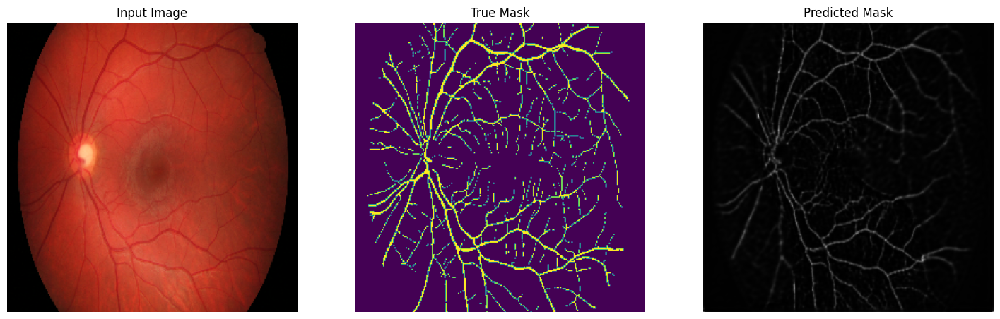

1/1 [==============================] - 0s 46ms/step


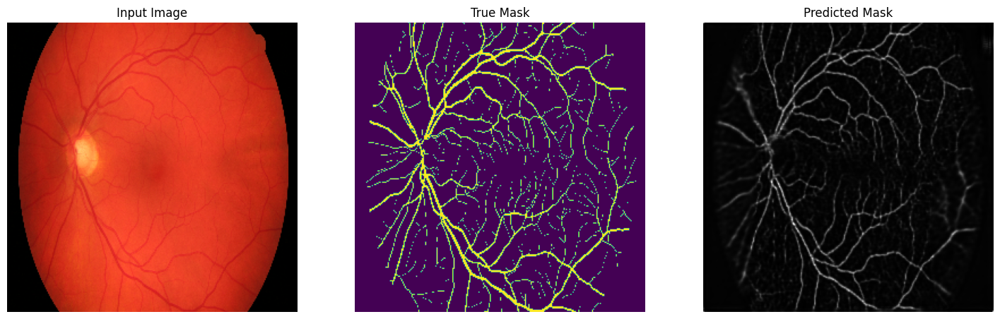

1/1 [==============================] - 0s 38ms/step


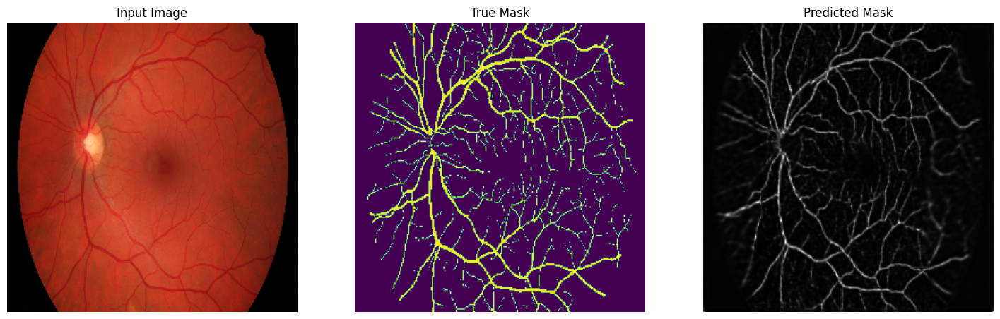

1/1 [==============================] - 0s 43ms/step


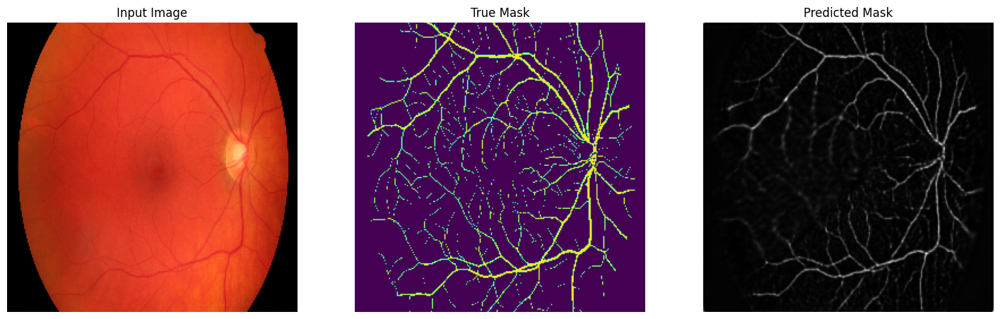

1/1 [==============================] - 0s 45ms/step


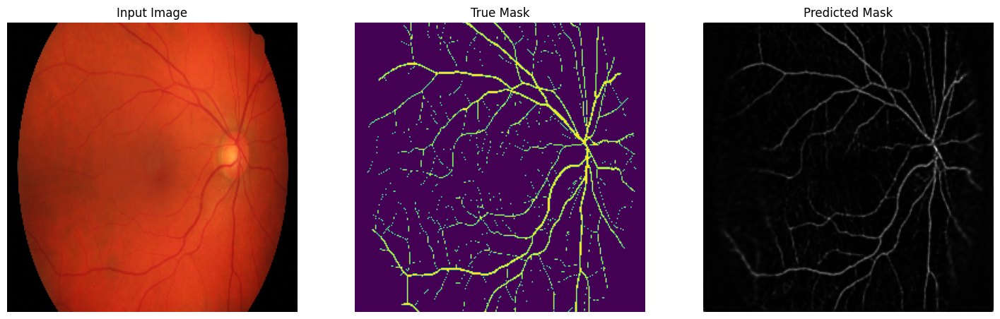

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Function to display the input image, its true mask, and the predicted mask
def display_result(display_list):
    plt.figure(figsize=(18, 6))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        if i == 2:
            plt.imshow(display_list[i].squeeze(), cmap='gray')
        else:
            plt.imshow(display_list[i].squeeze())
        plt.axis('off')
    plt.show()

# Path to the saved model
model_path = '/content/segmentation_model_epoch_500.h5'

# Load the model from the specified path
model = load_model(model_path)

# Determine the number of images to display
num_images_to_display = min(len(X_val), len(y_val), 5)

# Display results for a few validation images
for i in range(num_images_to_display):
    test_image = X_val[i]
    true_mask = y_val[i]

    # Use the loaded model to predict the mask for the validation image
    pred_mask = model.predict(np.expand_dims(test_image, axis=0))[0].squeeze()

    display_list = [test_image, true_mask, pred_mask]

    # Display the results
    display_result(display_list)


### Leveraging MobileNet for Image Segmentation
This script highlights the integration of MobileNet as the backbone in a U-Net architecture for image segmentation tasks. By employing MobileNet, known for its efficiency on mobile devices due to depthwise separable convolutions, the model aims to provide a balance between performance and computational cost. The setup involves configuring the segmentation model with ImageNet pre-trained weights to enhance feature extraction capabilities. The model is then compiled with the Adam optimizer and binary cross-entropy loss, making it suitable for binary segmentation tasks.

In [ ]:
import os
import tensorflow as tf
import segmentation_models as sm
import numpy as np
import matplotlib.pyplot as plt

# Setting up the environment
os.environ["SM_FRAMEWORK"] = "tf.keras"
sm.set_framework('tf.keras')
sm.framework()

# Define the backbone
BACKBONE = 'mobilenet'
n_classes = 1
activation = 'sigmoid'

# Create the U-Net model with MobileNet as the backbone
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation, encoder_weights='imagenet')

# Compile the model
model.compile(
    optimizer='Adam',
    loss='binary_crossentropy',
    metrics=['accuracy', 'binary_crossentropy'])

# Fit the model on the training data
history = model.fit(
    x=X_train,
    y=y_train_normalized,
    batch_size=5,
    epochs=500,
    validation_split=0.25,
    verbose=2
)

# Save the model
model.save('/mnt/data/mobilenet_unet_model.h5')




Epoch 1/500
4/4 - 15s - loss: 0.5815 - accuracy: 0.6642 - binary_crossentropy: 0.5815 - val_loss: 0.1156 - val_accuracy: 0.8782 - val_binary_crossentropy: 0.1156 - 15s/epoch - 4s/step
Epoch 2/500
4/4 - 0s - loss: 0.3890 - accuracy: 0.8899 - binary_crossentropy: 0.3890 - val_loss: 0.0169 - val_accuracy: 0.9220 - val_binary_crossentropy: 0.0169 - 154ms/epoch - 39ms/step
Epoch 3/500
4/4 - 0s - loss: 0.2820 - accuracy: 0.9180 - binary_crossentropy: 0.2820 - val_loss: 0.0093 - val_accuracy: 0.9232 - val_binary_crossentropy: 0.0093 - 151ms/epoch - 38ms/step
Epoch 4/500
4/4 - 0s - loss: 0.2137 - accuracy: 0.9196 - binary_crossentropy: 0.2137 - val_loss: 0.0056 - val_accuracy: 0.9235 - val_binary_crossentropy: 0.0056 - 150ms/epoch - 37ms/step
Epoch 5/500
4/4 - 0s - loss: 0.1666 - accuracy: 0.9195 - binary_crossentropy: 0.1666 - val_loss: 0.0051 - val_accuracy: 0.9236 - val_binary_crossentropy: 0.0051 - 148ms/epoch - 37ms/step
Epoch 6/500
4/4 - 0s - loss: 0.1346 - accuracy: 0.9196 - binary_cros

### Visualizing Model Training Performance
This visualization illustrates the loss metrics for both the training and validation phases across each epoch. By plotting these metrics side by side, we can assess how well the model is learning and generalizing to new data. The blue line represents the training loss, indicating how well the model fits the training data, while the red line shows the validation loss, which provides insight into the model's performance on unseen data.

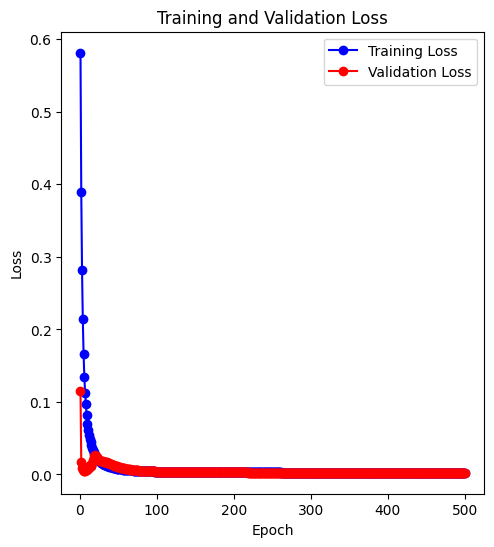

In [ ]:
import matplotlib.pyplot as plt

# Accessing the loss and accuracy data from the training history
training_loss = history.history['loss']
validation_loss = history.history['val_loss']
epochs_range = range(1, len(training_loss) + 1)
# Creating plots for loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, training_loss, 'bo-', label='Training Loss')
plt.plot(epochs_range, validation_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()




### Visualizing Predictions from the Trained Model
This script demonstrates how to visualize the outcomes of a trained segmentation model. The function display_images_and_masks is designed to show original images from the dataset alongside their true masks and the masks predicted by the model. Each trio of images includes the original input, the ground truth mask, and the model's prediction, allowing for a direct comparison. This visualization helps in assessing the model's accuracy and effectiveness in capturing the relevant features for mask prediction.

1/1 [==============================] - 1s 585ms/step


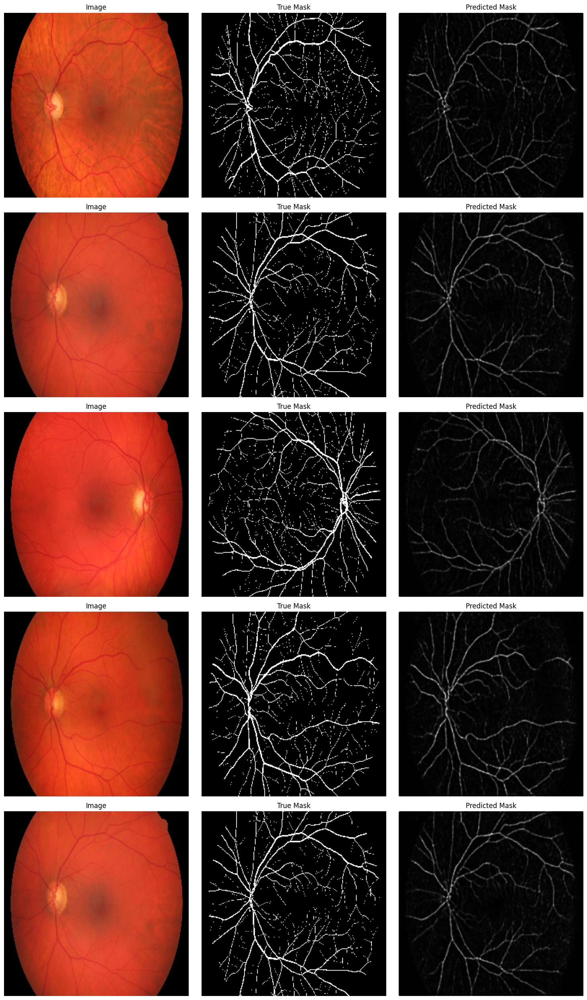

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
from tensorflow.keras.models import load_model

def adjust_brightness(image, factor=2.0):
    return np.clip(image * factor, 0, 1)

# Function to display images, their corresponding true masks, and the predicted masks
def display_images_and_masks(images, true_masks, preds_masks, number_to_display=5):

    plt.figure(figsize=(15, 5 * number_to_display))

    for i in range(number_to_display):
        index = random.randint(0, len(images) - 1)
        image = images[index]
        true_mask = true_masks[index]
        predicted_mask = preds_masks[index]

        plt.subplot(number_to_display, 3, 3 * i + 1)
        plt.imshow(image.squeeze(), cmap='gray')
        plt.title('Image')
        plt.axis('off')

        plt.subplot(number_to_display, 3, 3 * i + 2)
        plt.imshow(true_mask.squeeze(), cmap='gray')
        plt.title('True Mask')
        plt.axis('off')

        plt.subplot(number_to_display, 3, 3 * i + 3)
        plt.imshow(predicted_mask.squeeze(), cmap='gray')
        plt.title('Predicted Mask')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Load your trained model
model = load_model('/content/mobilenet_unet_model.h5')

preds_masks = model.predict(X_train, verbose=1)

adjusted_preds_masks = np.array([adjust_brightness(mask, factor=1.0) for mask in preds_masks])

# Display a sample of images, true masks, and predicted masks
display_images_and_masks(X_train, y_train, adjusted_preds_masks, number_to_display=5)


### Model Prediction Visualization
This script demonstrates the process of loading a pre-trained image segmentation model and using it to predict the mask for a new image. It begins by defining a function to load and preprocess the image, ensuring it is appropriately sized and normalized for model input. The image and model paths are specified, and the model is loaded from disk. The image is then fed into the model, which predicts the segmentation mask.

1/1 [==============================] - 2s 2s/step


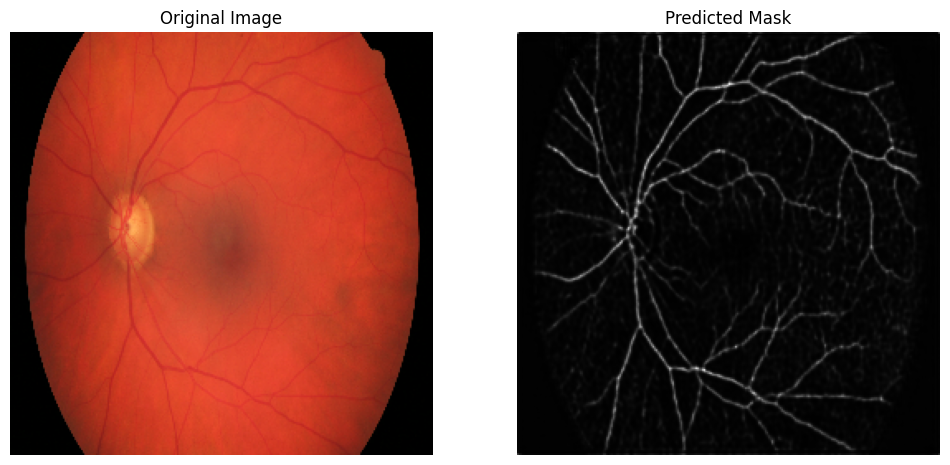

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
from PIL import Image

# Function to load and preprocess the image
def load_and_preprocess_image(image_path, target_size=(256, 256)):
    img = load_img(image_path, target_size=target_size)
    img_array = img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0)

# Path to the saved model and image
model_path = '/content/mobilenet_unet_model.h5'
image_path = '/content/Image1.jpg'

# Load the model
model = load_model(model_path)

# Load and preprocess the image
input_image = load_and_preprocess_image(image_path)

# Predict the mask for the input image
predicted_mask = model.predict(input_image)[0].squeeze()

# Display the original image and the predicted mask
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(np.squeeze(input_image), cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(predicted_mask, cmap='gray')
plt.title('Predicted Mask')
plt.axis('off')

plt.show()


### Datasets Link:

Drive Dataset "https://www.kaggle.com/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction"


High-Resolution Fundus (HRF) Image Database "https://www5.cs.fau.de/research/data/fundus-images/"